# World Data League 2023

## Team: CalmCod3rs
## 👥 Authors
- Ana Luiza Kaori Akiyama
- Guilherme Caixeta
- Luiz Gustavo Moniz




###  **Table of Contents**

###  1 -[Introduction](#first-bullet)

###  2 -[Exploratory Data Analysis (EDA)](#second-bullet)

###  3 -[Exploratory Spatial Data Analysis (ESDA)](#third-bullet)

###  4 -[Forecasting Model](#fourth-bullet)

###  5 -[Determining The Main Mobility Flows](#fifth-bullet)

###  6 -[Conclusion](#sixth-bullet)

###  7 -[References](#seventh-bullet)

###  8 -[Appendix 1: Main Functions](#eithth-bullet)

## 🎯 Challenge
Determining The Main Mobility Flows in the City
of Lisbon Based on Mobile Device Data


##  1 - <span style="color:blue">Introduction</span>  <a class="anchor" id="first-bullet"></a>

In the last decades, the Lisbon Metropolitan Area (AML) has gone through important urban, social, and economic dynamics. Among those dynamics, two are of particular relevance: first, the demographic outward flow of Lisbon residents to AML’s neighboring municipalities, and, secondly,the proliferation of car ownership and its widespread use. [1]


### Load libraries

In [34]:
import io
import PIL
import cv2
import json
import pygeoda
import matplotlib
import hvplot.dask
import numpy as np
import pandas as pd
import hvplot.pandas
import seaborn as sns
import geopandas as gpd
import contextily as ctx
import plotly.express as px
import dask.dataframe as dd
from shapely.geometry import shape
from matplotlib import pyplot as plt
from dask.diagnostics import ProgressBar
from IPython.display import Image, display

In [4]:
%load_ext holoviews.ipython
hvplot.extension("bokeh")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

### Load Dataset


We are going to load 4 datasets:

1- CML – DISPOSITIVOS MOVEIS_GRELHA :
- Information on the number of active mobile phones per square of 200m/200m every 15 minutes - Squares of the city of Lisbon

2- CML_DISPOSITIVOS MOVEIS_EIXOS :
- Number of mobile phones entering and leaving the city every 15 minutes on the 11 main road axes in the city of Lisbon

3- WAZE_JAMS:
- Traffic level data recorded through the WAZE platform

4- DISPOSITIVOS MOVEIS_TROÇOS DE VIA_TROÇOS DE VIA:
- Mapping of road sections used to calculate city entrances and exits


In [58]:
dtypes = {
    "C1": "float32",
    "C2": "float32",
    "C3": "float32",
    "C4": "float32",
    "C5": "float32",
    "C6": "float32",
    "C7": "float32",
    "C8": "float32",
    "Grid_ID": "int16",
}

In [59]:
terminals_data, metadata = load_terminals_data(dtypes)
entrances, eixos, ids, coords = load_entrances_data()

In [32]:
terminals_data = pd.read_pickle("terminals_data.pkl")

## 💻 Development


##  2 - <span style="color:blue">Exploratory Data Analysis (EDA)</span>  <a class="anchor" id="second-bullet"></a>

Dataset: CML – DISPOSITIVOS MOVEIS_GRELHA

Columns description:

- C1 - Number of distinct terminals in the grid (total)
- C2 - Number of different terminals, in roaming, in the grid
- C3 - Number of different terminals that remained in the grid
- C4 - Number of different terminals that remained in the grid, in roaming
- C5 - Number of different terminal entries in the grid
- C6 - Number of different terminal outputs in the grid
- C7 - Number of different terminal entries, in roaming, in the grid
- C8 - Number of outputs from different terminals, in roaming, in the grid

Firstly, let's analyze the distribution of each dataset's column. On the table below, it is possible to notice that 99% quantile is quite different from the maximum value. On the C1 column for example, we have a max value of 313284.09, which is 300 times higher than 99% quantile, and more than 1386 standard deviations, suggesting that this dataset may have some outliers.

In [139]:
pd.set_option("display.float_format", lambda x: "%.2f" % x)
terminals_data.iloc[:, 1:].describe([0.01, 0.25, 0.5, 0.75, 0.99])

,C1,C2,C3,C4,C5,C6,C7,C8
count,30881257.00,30881257.00,30881257.00,30881257.00,30881257.00,30881257.00,30881257.00,30881257.00
mean,169.75,23.75,140.43,19.80,59.81,71.05,8.52,8.39
std,256.47,66.41,223.93,57.81,106.45,107.81,26.32,23.33
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,31.39,0.00,24.29,0.00,4.15,11.94,0.00,0.00
50%,88.15,5.07,70.31,4.07,23.94,36.90,0.00,1.40
75%,208.01,18.34,169.35,14.79,71.13,88.39,6.55,7.25
99%,1165.26,307.45,1001.56,264.22,484.65,490.86,116.75,102.88
max,313284.09,5698.95,313284.09,5592.52,11866.67,12691.48,2225.49,2110.37


Although it seems that all max values are outliers, it is important to check if the previous and posterior row (15 minutes before and after) are also high. On the table below, it is possible to notice that C1 column value 313284.09 is not proportional with the rows above and below. However, the C6 column values 12691.48 are proportional, which may indicate some uncommon event was happening in that period.

In [140]:
terminals_data[
    (terminals_data["Datetime"] >= "2022-09-15 21:45:00+00:00")
    & (terminals_data["Datetime"] <= "2022-09-15 23:45:00+00:00")
    & (terminals_data["Grid_ID"] == 440)
][["Grid_ID", "Datetime", "C1"]]

,Grid_ID,Datetime,C1
3622739,440,2022-09-15 21:45:00+00:00,286.04
3622740,440,2022-09-15 22:00:00+00:00,409.24
3622741,440,2022-09-15 22:15:00+00:00,159.38
3622742,440,2022-09-15 22:30:00+00:00,0.00
3622743,440,2022-09-15 22:45:00+00:00,313284.09
3622744,440,2022-09-15 23:00:00+00:00,209.55
3622745,440,2022-09-15 23:15:00+00:00,308.86
3622746,440,2022-09-15 23:30:00+00:00,257.22
3622747,440,2022-09-15 23:45:00+00:00,419.25


In [141]:
terminals_data[
    (terminals_data["Datetime"] >= "2022-10-02 01:45:00+00:00")
    & (terminals_data["Datetime"] <= "2022-10-02 03:45:00+00:00")
    & (terminals_data["Grid_ID"] == 3073)
][["Grid_ID", "Datetime", "C6"]]

,Grid_ID,Datetime,C6
25348012,3073,2022-10-02 01:45:00+00:00,11541.14
25348013,3073,2022-10-02 02:00:00+00:00,11575.65
25348014,3073,2022-10-02 02:15:00+00:00,11696.79
25348015,3073,2022-10-02 02:30:00+00:00,12006.41
25348016,3073,2022-10-02 02:45:00+00:00,12691.48
25348017,3073,2022-10-02 03:00:00+00:00,11918.13
25348018,3073,2022-10-02 03:15:00+00:00,9407.69
25348019,3073,2022-10-02 03:30:00+00:00,7173.47
25348020,3073,2022-10-02 03:45:00+00:00,4467.85


The team adopt the following criteria to deal with outliers:
- Select all values above 99% quantile
- Check what happened 15 minutes before/after
   - If the difference between any of the rows (before/after) are higher than 10 times, we are going to input a new value ( before/after rows's mean).
   - If the difference are lower than 10 times, we will not consider this value as outlier  

In [142]:
for column in terminals_data.columns[2:]:
    terminals_data = outlier_detection(terminals_data, column)

1921 outliers detected on column C1!
34 outliers detected on column C2!
1944 outliers detected on column C3!
35 outliers detected on column C4!
7977 outliers detected on column C5!
4533 outliers detected on column C6!
756 outliers detected on column C7!
329 outliers detected on column C8!


In [21]:
pd.set_option("display.float_format", lambda x: "%.2f" % x)
terminals_data.iloc[:, 1:].describe([0.01, 0.25, 0.5, 0.75, 0.99])

,C1,C2,C3,C4,C5,C6,C7,C8
count,30881257.00,30881257.00,30881257.00,30881257.00,30881257.00,30881257.00,30881257.00,30881257.00
mean,169.60,23.75,140.29,19.80,59.50,70.87,8.51,8.39
std,249.38,66.41,215.87,57.80,103.85,106.47,26.29,23.32
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,31.39,0.00,24.29,0.00,4.14,11.93,0.00,0.00
50%,88.14,5.07,70.31,4.07,23.93,36.89,0.00,1.40
75%,207.97,18.34,169.31,14.79,71.06,88.35,6.55,7.25
99%,1162.76,307.43,999.45,264.21,480.01,488.28,116.58,102.83
max,133676.41,5698.95,133676.41,5592.52,10207.06,12691.48,2225.49,2110.37


Let's count null values in each column. 

The table below shows there is no null value in the dataset, so it is not necessary to handle that.

In [23]:
terminals_data.isnull().sum()

Grid_ID     0
Datetime    0
C1          0
C2          0
C3          0
C4          0
C5          0
C6          0
C7          0
C8          0
dtype: int64

Let's analyze the average number of distinct terminals in the course of a entire day each 15 minutes, and compare it during weekdays and weekends. 

The image above show us that during the dawn, weekends average is higher than weekdays, however the opposite is true during the work-hour. 

In [160]:
gps_data_time_weekdays = average_density(terminals_data, "C1", weekend=False)
gps_data_time_weekends = average_density(terminals_data, "C1", weekend=True)
gps_data_time_weekends = gps_data_time_weekends.rename(columns={"C1": "C1_weekends"})

In [165]:
(
    gps_data_time_weekdays.merge(
        gps_data_time_weekends, on=["Time", "Hour", "Minutes"], how="left"
    )
    .hvplot.line(
        x="Time",
        y=["C1", "C1_weekends"],
        value_label="Number of distinct terminals in the grid (total)",
        height=800,
        width=1500,
    )
    .opts(xrotation=90)
)

:NdOverlay   [Variable]
   :Curve   [Time]   (Number of distinct terminals in the grid (total))

Let's check the average number of the distinct terminals by weekday.
It is possible to notice on the heatmap below the difference during rush hours during weekdays and weekends.

In [162]:
avg_week = average_week(terminals_data, "C1")
avg_week = avg_week.sort_values(["Hour", "Minutes", "Weekdidx"])

In [163]:
avg_week = avg_week.reset_index(drop=True)

In [164]:
avg_week.hvplot.heatmap(
    x="Time",
    y="Weekday",
    C="C1",
    width=1500,
    height=800,
    # title='Freguesia',
    cmap=[
        "#75968f",
        "#a5bab7",
        "#c9d9d3",
        "#e2e2e2",
        "#dfccce",
        "#ddb7b1",
        "#cc7878",
        "#933b41",
        "#550b1d",
    ],
    # xaxis='top',
    rot=70,
).opts(
    xrotation=90
)  # .opts(show_values=False)

:HeatMap   [Time,Weekday]   (C1)

In [154]:
terminals_data = pd.read_pickle("terminals_data.pkl")
terminals_data = terminals_data.merge(
    metadata, how="left", right_on="grelha_id", left_on="Grid_ID"
)

In [155]:
terminals_data_freguesia = terminals_data.groupby(['Datetime', 'freguesia']).sum().reset_index()
terminals_data_freguesia['Hour'] = terminals_data_freguesia['Datetime'].dt.hour

In [156]:
dsk = dd.from_pandas(terminals_data_freguesia, npartitions=50)

In order to analyze the distribution of distinct terminals by neighborhoods, a box plot was generated by neighborhoods. Each observation represents the accumulated sum of each grid that belongs to that neighborhood, each 15 minutes.

In [157]:
chart_freguesia = dsk.hvplot.box(
    y="C1", by="freguesia", width=800, height=800, invert=True, xformatter="%.0f"
)
chart_freguesia

:BoxWhisker   [freguesia]   (C1)

In [158]:
avg_freguesia = average_freguesia(terminals_data, "C1")

In [166]:
avg_freguesia.hvplot.heatmap(
    y="freguesia",
    x="Time",
    C="C1",
    width=1500,
    height=800,
    # title='Freguesia',
    cmap=[
        "#75968f",
        "#a5bab7",
        "#c9d9d3",
        "#e2e2e2",
        "#dfccce",
        "#ddb7b1",
        "#cc7878",
        "#933b41",
        "#550b1d",
    ],
    rot=70,
).opts(
    xrotation=90
)  # .opts(show_values=False)

:HeatMap   [Time,freguesia]   (C1)

##  3 - <span style="color:blue">Exploratory Spatial Data Analysis (ESDA)</span>  <a class="anchor" id="third-bullet"></a>

In this section we started the ESDA analyzing the 11 main roads of Lisbon. 

The CML_DISPOSITIVOS MOVEIS_EIXOS Dataset contains 2 important columns that represents:

- C12 - Number of entrances in Lisbon by the 11 main road axes
- C13 - Number of departures from Lisbon on the 11 main road routes

Let's start observing the distribution of the dataset and check for null values

In [ ]:
entrances_data[["C12", "C13"]].describe()

,C12,C13
count,272492.00,272492.00
mean,111.38,108.52
std,137.66,130.31
min,0.00,0.00
25%,14.97,14.39
50%,64.82,65.67
75%,159.49,158.27
max,4080.91,5151.67


In [ ]:
entrances_data[["C12", "C13"]].isnull().sum()

C12    0
C13    0
dtype: int64

#### Which of these 11 roads has the highest number of entrances and departures ?

On the map and tables below, it is possible to verify that on average road IC19 has the highest number of entrances and departures.

In [78]:
# terminals_data, metadata = load_terminals_data(dtypes)
entrances, eixos, ids, coords = load_entrances_data()
gps_data_map = roads_11_summarize(entrances, ids, coords, weekend=False)

/home/akaori/.conda/envs/wdl-mobility/lib/python3.7/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


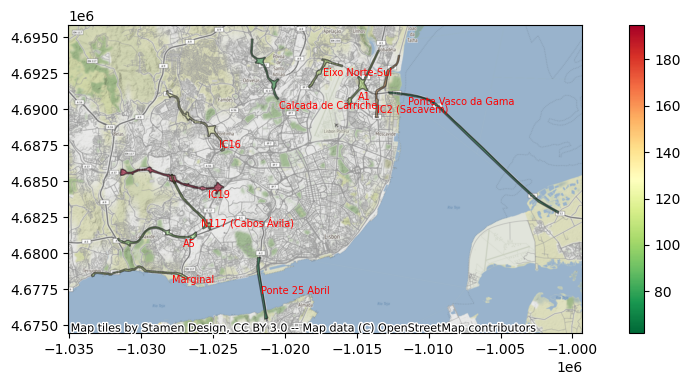

In [79]:
plot_roads_map(gps_data_map, title="Roads Map", column="C12")

In [84]:
gps_data_map[['Eixo', 'C12', 'C13']].sort_values(['C12'], ascending=False)

,Eixo,C12,C13
10,IC19,198.737091,194.834458
12,IC2 (Sacavém),156.969720,153.273786
8,IC16,130.252709,123.778917
0,A1,117.465817,104.911973
14,Marginal,114.289971,109.530712
6,Eixo Norte-Sul,108.421249,108.256786
16,N117 (Cabos Ávila),98.218127,99.781086
4,Calçada de Carriche,87.851633,83.179493
2,A5,87.760431,94.853049
18,Ponte 25 Abril,73.664744,63.301343


In [87]:
gps_data_map = roads_11_summarize(entrances, ids, coords, weekend=True)
gps_data_map[['Eixo', 'C12', 'C13']].sort_values(['C12'], ascending=False)

,Eixo,C12,C13
11,IC19,196.334869,190.818841
13,IC2 (Sacavém),150.174646,151.482088
9,IC16,115.594718,111.482291
1,A1,108.848664,101.352794
15,Marginal,106.710157,107.932195
7,Eixo Norte-Sul,105.571486,110.747201
17,N117 (Cabos Ávila),103.366064,104.893114
19,Ponte 25 Abril,85.634820,76.043532
5,Calçada de Carriche,75.926336,72.949242
3,A5,75.644105,84.375690


#### Which regions of Lisbon have the highest density of terminals ?

On the animated map below, it is possible to verify the regions of Lisbon which have higher density (on average) during each hour of the day.

In [137]:
gps_data_c1 = summarize_gps(terminals_data, metadata, column="C1", weekend=False)

In [ ]:
crs = {"init": "epsg:4326"}

gps_data = gpd.GeoDataFrame(
    gps_data_c1,
    geometry=gpd.points_from_xy(gps_data_c1.longitude, gps_data_c1.latitude, crs=crs),
)

In [139]:
fig = plot_heatmap(gps_data, column="C1", frame="Hour")

# generate images for each step in animation
frames = []
for s, fr in enumerate(fig.frames):
    # set main traces to appropriate traces within plotly frame
    fig.update(data=fr.data)
    # move slider to correct place
    fig.layout.sliders[0].update(active=s)
    # generate image of current state
    frames.append(PIL.Image.open(io.BytesIO(fig.to_image(format="png"))))

# create animated GIF
frames[0].save(
    "heat_density.gif",
    save_all=True,
    append_images=frames[1:],
    optimize=True,
    duration=1000,
    loop=0,
)

### Heatmap - Average number of distinct terminals in the grid 

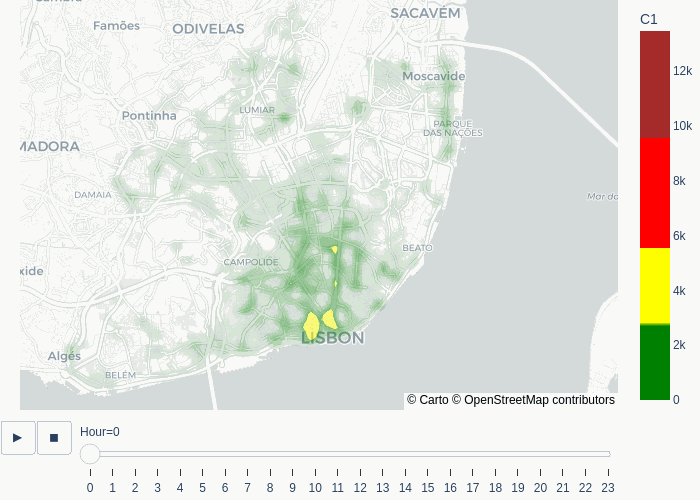

In [140]:
with open("heat_density.gif", "rb") as f:
    display(Image(data=f.read(), format="png"))

#### Which regions of Lisbon have the highest density of foreign SIM cards?

In this case, we can see the tourist areas and the airport with a high density.

In [88]:
gps_data_c2 = summarize_gps(terminals_data, metadata, column="C2", weekend=False)

In [ ]:
crs = {"init": "epsg:4326"}

gps_data = gpd.GeoDataFrame(
    gps_data_c2,
    geometry=gpd.points_from_xy(gps_data_c2.longitude, gps_data_c2.latitude, crs=crs),
)

In [91]:
fig = plot_heatmap(gps_data, column="C2", frame="Hour")

# generate images for each step in animation
frames = []
for s, fr in enumerate(fig.frames):
    # set main traces to appropriate traces within plotly frame
    fig.update(data=fr.data)
    # move slider to correct place
    fig.layout.sliders[0].update(active=s)
    # generate image of current state
    frames.append(PIL.Image.open(io.BytesIO(fig.to_image(format="png"))))

# create animated GIF
frames[0].save(
    "roaming.gif",
    save_all=True,
    append_images=frames[1:],
    optimize=True,
    duration=1000,
    loop=0,
)

### Heatmap - Average number of distinct terminals, in roaming, in the grid

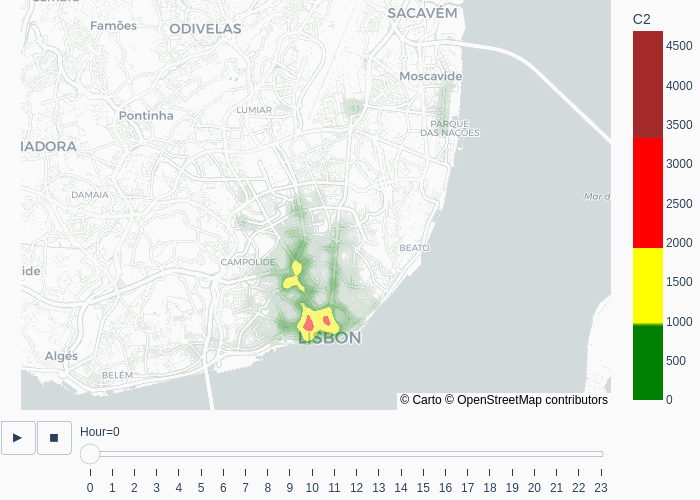

In [92]:
with open("roaming.gif", "rb") as f:
    display(Image(data=f.read(), format="png"))

Let's continue the ESDA, analyzing the Waze dataset. 

#### Which Lisbon streets have the most traffic during the day?

On the animated map, we can check which streets contain the most traffic during the morning.

In [34]:
data = pd.read_csv(
    "./data/CML_waze_jams_092022_1.csv",
    nrows=30000,
    converters={"position": json.loads},
)

In [35]:
import contextily as ctx
from shapely.geometry import shape

crs = {"init": "epsg:4326"}

gdf = gpd.GeoDataFrame(
    data,
    geometry=data.pop("position")
    .str["geometries"]
    .explode()
    .apply(lambda x: shape(x).geoms[0]),
    crs=crs,
)

/home/akaori/.conda/envs/wdl-mobility/lib/python3.7/site-packages/pyproj/crs/crs.py:131: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



In [36]:
gdf["entity_ts"] = pd.to_datetime(gdf["entity_ts"])
gdf["entity_ts_15"] = gdf["entity_ts"].dt.round("15min")

In [37]:
gdf = (
    gdf.set_index(["entity_ts_15", "level"])
    .geometry.apply(lambda x: list(x.coords))
    .explode(ignore_index=False)
    .apply(pd.Series)
    .reset_index()
    .rename(columns={0: "Longitude", 1: "Latitude"})
)

gdf["Time"] = pd.to_datetime(gdf["entity_ts_15"]).dt.time

In [39]:
gdf = gdf[gdf["entity_ts_15"] >= "2022-09-01 06:00:00"]

In [40]:
gdf = gdf.sort_values(["entity_ts_15", "level"], ascending=[True, False])

In [41]:
gdf["level"] = gdf["level"].astype(str)

In [135]:
fig = plot_jams_map(gdf)
# generate images for each step in animation
frames = []
for s, fr in enumerate(fig.frames):
    # set main traces to appropriate traces within plotly frame
    fig.update(data=fr.data)
    # move slider to correct place
    fig.layout.sliders[0].update(active=s)
    # generate image of current state
    frames.append(PIL.Image.open(io.BytesIO(fig.to_image(format="png"))))

# create animated GIF
frames[0].save(
    "waze.gif",
    save_all=True,
    append_images=frames[1:],
    optimize=True,
    duration=1000,
    loop=0,
)

### Traffic Jam Analysis during a typical working day in the morning

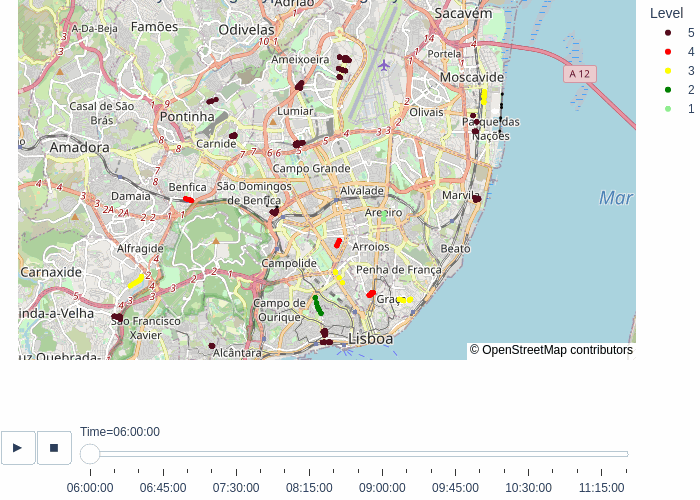

In [136]:
with open("waze.gif", "rb") as f:
    display(Image(data=f.read(), format="png"))

#### Cluster Analysis
In order to identify the main areas of density by grid and see similar patterns, let's use a cluster analysis called LISA, developed by Luc Anselin. 

The LISA map displays four results: the first is the representation of the values with a High-High (AA) grouping, composed of spatial units (grids) with high values surrounded by spatial units that also have high values; the second represents spatial units with a Low-High (BA) grouping, where any spatial unit with low value is surrounded by high value spatial units. The third represents spatial units with a Low-Low (BB) grouping, where any spatial unit with low value is ​​surrounded by space units that also have low values. Finally, the fourth represents the High-Low (AB) cluster, in which any spatial unit with a low value of the variable of interest is surrounded by spatial units of high value (ANSELIN, 1995)

In [61]:
gps_data = terminals_data[
    terminals_data["Datetime"] == "2022-09-01 09:00:00+00:00"
].reset_index(drop=True)

In [ ]:
crs = {"init": "epsg:4326"}

gps_data = gpd.GeoDataFrame(
    gps_data,
    geometry=gpd.points_from_xy(gps_data.longitude, gps_data.latitude, crs=crs),
)

In [63]:
guerry = pygeoda.open(gps_data)
queen_w = pygeoda.queen_weights(guerry)
crm_prp = gps_data["C1"]
crm_lisa = pygeoda.local_moran(queen_w, crm_prp)

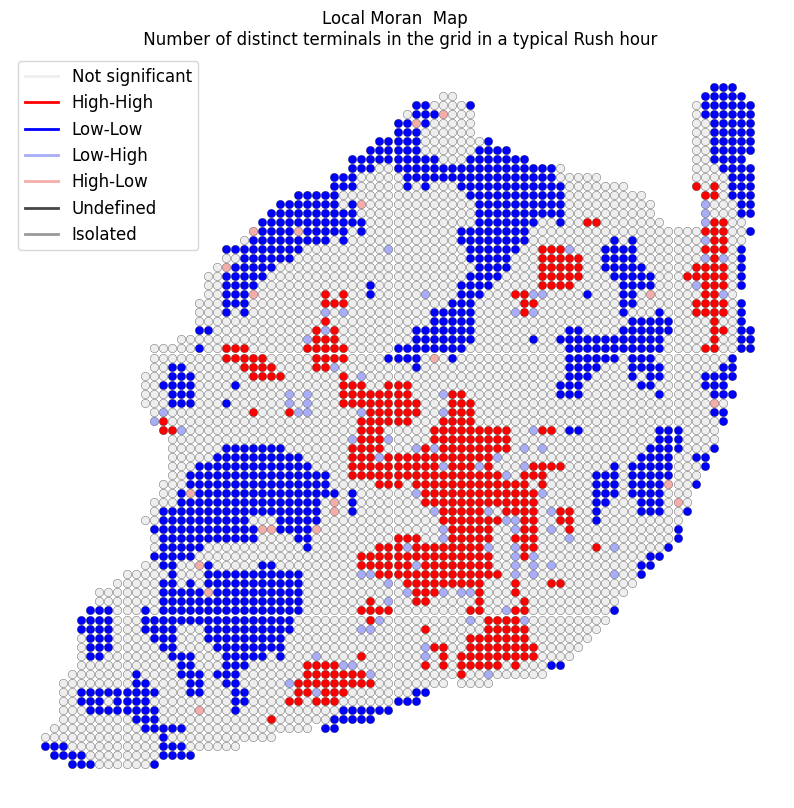

In [64]:
fig, ax = plt.subplots(figsize=(10, 10))
lisa_colors = crm_lisa.lisa_colors()
lisa_labels = crm_lisa.lisa_labels()

# attach LISA cluster indicators to geodataframe
gps_data["LISA"] = crm_lisa.lisa_clusters()

for ctype, data in gps_data.groupby("LISA"):
    color = lisa_colors[ctype]
    lbl = lisa_labels[ctype]
    data.plot(color=color, ax=ax, label=lbl, edgecolor="black", linewidth=0.2)

# Place legend in the lower right hand corner of the plot
lisa_legend = [
    matplotlib.lines.Line2D([0], [0], color=color, lw=2) for color in lisa_colors
]
ax.legend(lisa_legend, lisa_labels, loc="upper left", fontsize=12, frameon=True)
ax.set(
    title="Local Moran  Map \n Number of distinct terminals in the grid in a typical Rush hour"
)
ax.set_axis_off()

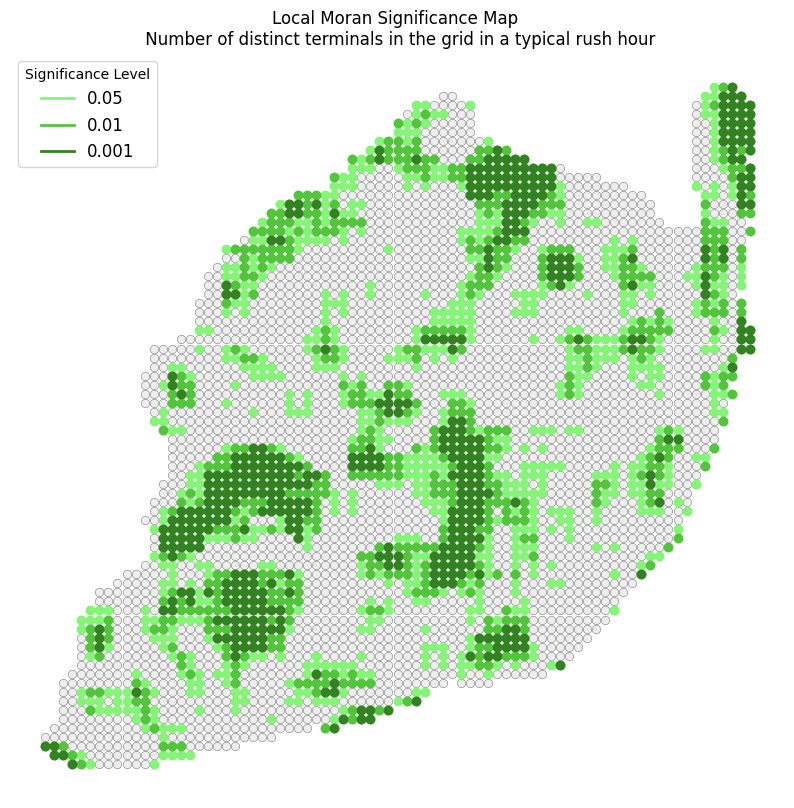

In [65]:
gps_data["LISA_PVAL"] = crm_lisa.lisa_pvalues()
fig, ax = plt.subplots(figsize=(10, 10))
gps_data.plot(color="#eeeeee", ax=ax, edgecolor="black", linewidth=0.2)
gps_data[gps_data["LISA_PVAL"] <= 0.05].plot(color="#84f576", ax=ax)
gps_data[gps_data["LISA_PVAL"] <= 0.01].plot(color="#53c53c", ax=ax)
gps_data[gps_data["LISA_PVAL"] <= 0.001].plot(color="#348124", ax=ax)
lisa_legend = [
    matplotlib.lines.Line2D([0], [0], color=color, lw=2)
    for color in ["#84f576", "#53c53c", "#348124"]
]
lisa_labels = ("0.05", "0.01", "0.001")
ax.legend(
    lisa_legend,
    lisa_labels,
    loc="upper left",
    fontsize=12,
    frameon=True,
    title="Significance Level",
)
ax.set(
    title="Local Moran Significance Map \n Number of distinct terminals in the grid in a typical Rush hour"
)
ax.set_axis_off()

#### Which neighborhood has more grids classified as High-High and Low-Low ?

The first table below shows the neighborhood with more grids classified as High-High

In [75]:
gps_data[gps_data['LISA'].isin([1])].groupby(['freguesia'])['LISA'].value_counts().sort_values(ascending=False)

freguesia                LISA
Avenidas Novas           1       86
Arroios                  1       48
São Domingos de Benfica  1       47
Santo António            1       47
Parque das Nações        1       43
Santa Maria Maior        1       30
Olivais                  1       28
Campolide                1       27
Alvalade                 1       25
Campo de Ourique         1       20
Estrela                  1       19
Areeiro                  1       19
Misericórdia             1       17
Alcântara                1       16
Lumiar                   1        9
Carnide                  1        9
Benfica                  1        8
Penha de França          1        6
São Vicente              1        2
Name: LISA, dtype: int64

In [76]:
gps_data[gps_data['LISA'].isin([2])].groupby(['freguesia'])['LISA'].value_counts().sort_values(ascending=False)

freguesia                LISA
Benfica                  2       164
Olivais                  2       131
Marvila                  2       102
Belém                    2        82
Ajuda                    2        81
Santa Clara              2        81
Parque das Nações        2        79
Alcântara                2        70
Carnide                  2        64
Lumiar                   2        56
Alvalade                 2        33
Beato                    2        27
São Domingos de Benfica  2        20
Estrela                  2        18
Campolide                2         8
Penha de França          2         7
Santa Maria Maior        2         2
Areeiro                  2         1
São Vicente              2         1
Name: LISA, dtype: int64

##  4 - <span style="color:blue">Forecasting Model</span>  <a class="anchor" id="fourth-bullet"></a>

Let's start to model the dataset using a base model called Prophet, developed by Meta Team, which is an Additive Regressive Model:

f(t) = g(t) + s(t) + h(t) + X(t) + ε(t)

where:
- g(t) = Trend
- s(t) = Seasonality
- h(t) = Events
- X(t) = Extra Regressors

In [ ]:
data = terminals_data[['Datetime', 'C1', 'Grid_ID']].copy()
data.columns = ['ds', 'y', 'ID']

train_data = data[data['ds'].between('2022-09-01', '2022-09-07 23:45:00')].copy()
train_data['ds'] = pd.to_datetime(train_data['ds']).dt.tz_localize(None)

In [ ]:
m = NeuralProphet(trend_global_local="global", season_global_local="global")

In [ ]:
metrics = m.fit(train_data, freq="15T")

In [ ]:
test_data = data[data['ds'].between('2022-09-08', '2022-09-15 00:45:00')].copy()
test_data['ds'] = pd.to_datetime(test_data['ds']).dt.tz_localize(None)

In [ ]:
test_metrics = m.test(test_data)
test_metrics

In [4]:
test_metrics

,SmoothL1Loss,MAE,RMSE
0,0.098503,0.352982,0.482177


As it shows on the chart below, the model could not handle 0 values very well nor outliers that happened on september 10th

In [ ]:
vld_dt = test_data[test_data['ID'] == 1].sort_values('ds')

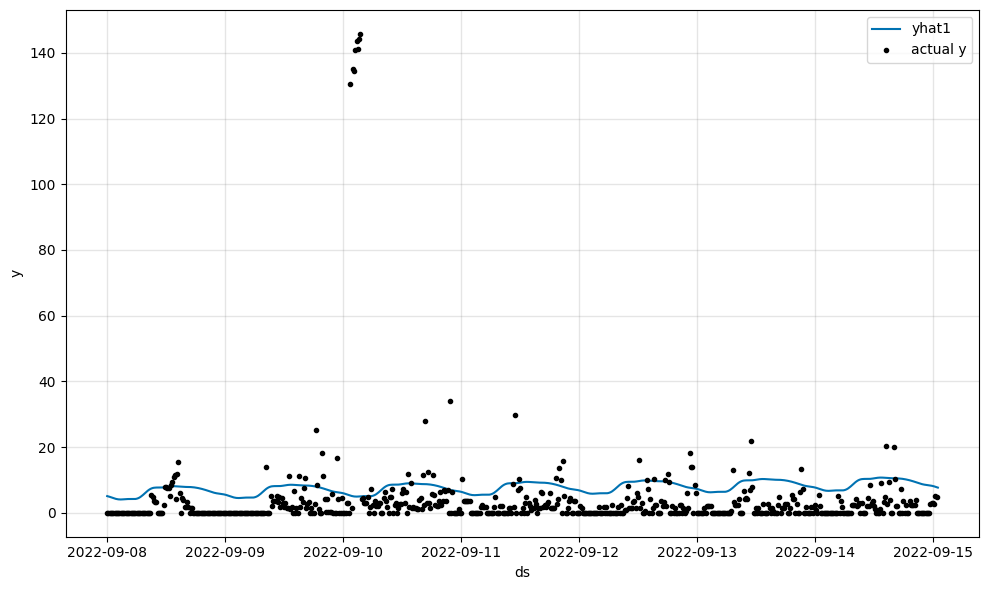

In [ ]:
future = m.make_future_dataframe(vld_dt, n_historic_predictions=True)
forecast = m.predict(future)
fig = m.plot(forecast)

The characteristics of the dataset may indicate some correlation with previous observations. Let consider two new variables in Prophet model:

f(t) = g(t) + s(t) + h(t) + X(t) + **A(t) + L(t)**

where:
- g(t) = Trend
- s(t) = Seasonality
- h(t) = Events
- X(t) = Extra Regressors
- **A(t) = Auto-regression effects at time t based on past observations**
- **L(t) = Regression effects at time t for lagged observations of exogenous variables**

In [ ]:
m = NeuralProphet(trend_global_local="global", season_global_local="global", n_lags=4*24*7)

In [ ]:
metrics = m.fit(train_data, freq="15T")

In [ ]:
test_metrics = m.test(test_data)

In [ ]:
test_metrics

,SmoothL1Loss,MAE,RMSE
0,0.087007,0.307071,0.451395


The chart below it is possible to notice the Ŷ value can detect the trend changes that happened on September 10th.

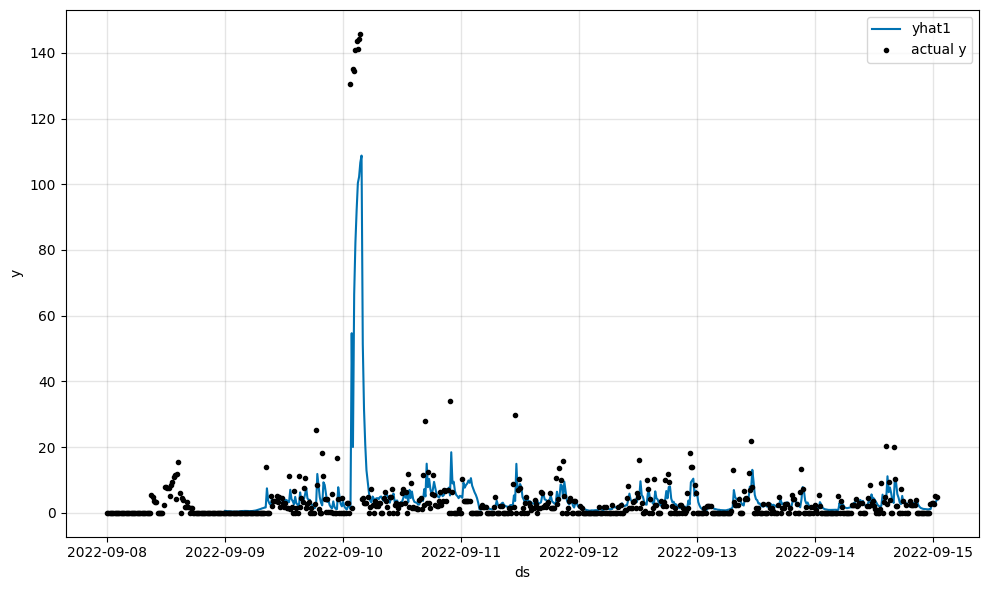

In [ ]:
future = m.make_future_dataframe(vld_dt, n_historic_predictions=True)
forecast = m.predict(future)
fig = m.plot(forecast)

##  5 - <span style="color:blue">Determining The Main Mobility Flows</span>  <a class="anchor" id="fifth-bullet"></a>

## One of the outcomes of this challenge is to acquire a deeper and more realistic knowledge of the flows that are generated between squares and with the access axes to the city, especially in the morning and afternoon rush hours (7:00 to 10:00 AM and 05:00 to 08:00 PM).

The data provided (CML – DISPOSITIVOS MOVEIS_GRELHA) doesn’t have a unique identifier for each mobile device, and the representation of the variation in the density of people over time doesn't indicate the direction of people flows. Therefore, we can use the Wasserstein distance between two consecutive density profiles. The computation of the Wasserstein distance gives, as a by-product, the optimal flow which, in our case, coarsely corresponds to the main directions followed by people. [2]

The Wasserstein metric, also called earth mover’s distance (EMD) is a measure of the distance between two frequency or probability distributions. It computes the “minimal work” distance between two weighted point configurations.

The implementation by Scipy of the Wasserstein Distance only works with 1D distributions. But we have a 2D distribution – latitude and longitude. The EMD is also used as a metric to compare the similarity between images (see, e.g., this). This is why there is an implementation by the OpenCV (Open Source Computer Vision Library) for 2D distributions, which we can use for our purposes. [3]

Let's start with a simple example:

In [29]:
arr1 = np.array([[2, 0, 0],
                 [2, 0, 0],
                 [0, 0, 2]])

arr2 = np.array([[0, 1, 1],
                 [2, 0, 0],
                 [0, 2, 0]])


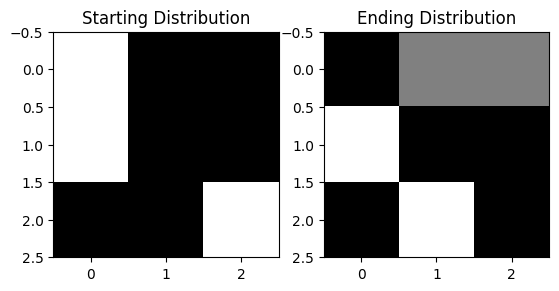

Red channel is "before"; green channel is "after"; yellow means "unchanged"


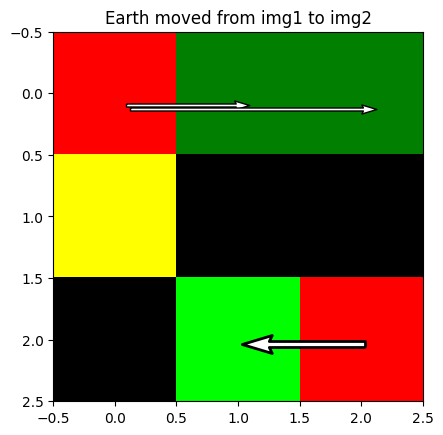

In [30]:
plot_movement(arr1, arr2, time1=None, time2=None, arrow_width_scale=3)

Now let's apply the same concept to a Lisbon neighborhood of the dataset

In [ ]:
time_1_afternoon = terminals_data[
    (terminals_data["Datetime"] == "2022-09-07 17:30:00")
    & (terminals_data["freguesia"].isin(["Lumiar"]))
].reset_index(drop=True)

In [ ]:
time_2_afternoon = terminals_data[
    (terminals_data["Datetime"] == "2022-09-07 17:45:00")
    & (terminals_data["freguesia"].isin(["Lumiar"]))
].reset_index(drop=True)

In [ ]:
arr_1 = generate_array(time_1_afternoon, column='C1')
arr_2 = generate_array(time_2_afternoon, column='C1')

In [ ]:
sig1 = img_to_sig(arr_1)
sig2 = img_to_sig(arr_2)
dist, _, flow = cv2.EMD(sig1, sig2, cv2.DIST_L2)

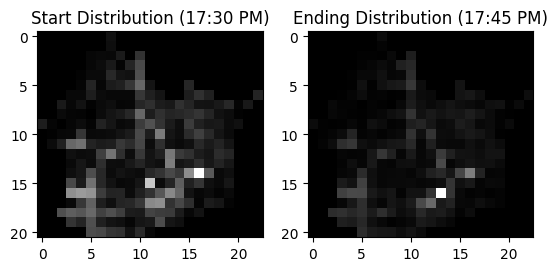

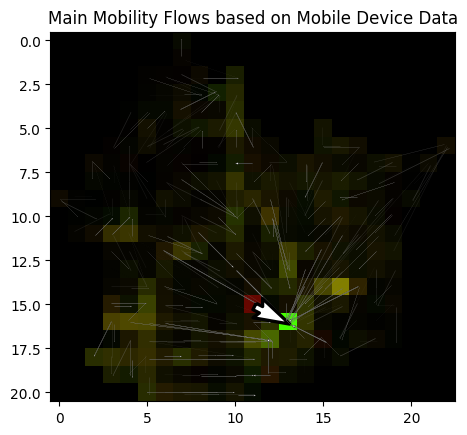

In [101]:
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(arr_1, cmap="gray")
ax1.set_title("Start Distribution (17:30 PM)")
ax2.imshow(arr_2, cmap="gray")
ax2.set_title("Ending Distribution (17:45 PM)")
plt.show()

plot_flow(
    sig1,
    sig2,
    flow,
    title="Main Mobility Flows based on Mobile Device Data",
    arrow_width_scale=0.01,
)

Let's now analyse the movement directions of a larger Lisbon area 

In [130]:
time_1_afternoon = terminals_data[
    (terminals_data["Datetime"] == "2022-09-07 17:00:00")
    & (terminals_data["freguesia"].isin(["Alcântara", 'Ajuda', 'Belém']))
].reset_index(drop=True)

In [131]:
time_2_afternoon = terminals_data[
    (terminals_data["Datetime"] == "2022-09-07 17:15:00")
    & (terminals_data["freguesia"].isin(["Alcântara", 'Ajuda', 'Belém']))
].reset_index(drop=True)

In [132]:
arr_1 = generate_array(time_1_afternoon, column='C1')
arr_2 = generate_array(time_2_afternoon, column='C1')

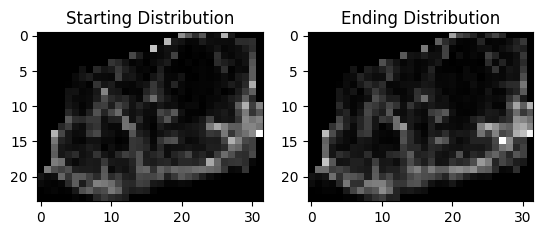

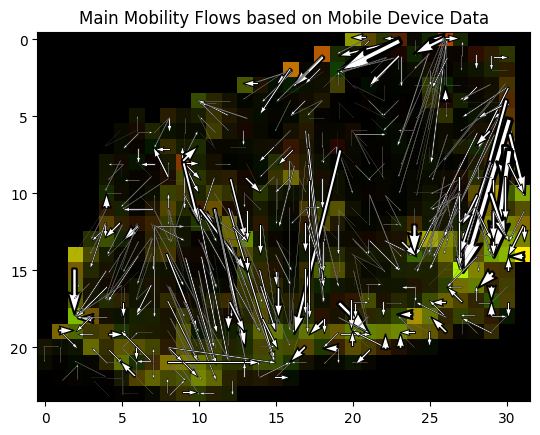

In [133]:
plot_movement(arr_1, arr_2, time1="17:00", time2="17:15",
              arrow_width_scale=0.08)

Lastly, let's analyze the movement directions for all available Lisbon grids in the dataset.

In [136]:
time_1_morning = terminals_data[
    terminals_data["Datetime"] == "2022-09-07 09:30:00"
].reset_index(drop=True)

In [137]:
time_2_morning = terminals_data[
    terminals_data["Datetime"] == "2022-09-07 09:45:00"
].reset_index(drop=True)

In [138]:
arr_1 = generate_array(time_1_morning, column='C1')
arr_2 = generate_array(time_2_morning, column='C1')
sig1 = img_to_sig(arr_1)
sig2 = img_to_sig(arr_2)
dist, _, flow = cv2.EMD(sig1, sig2, cv2.DIST_L2)

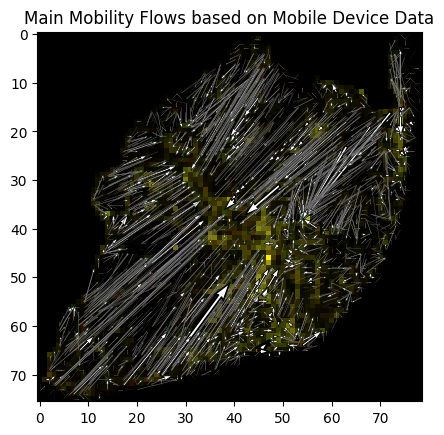

In [139]:
plot_flow(
    sig1,
    sig2,
    flow,
    title="Main Mobility Flows based on Mobile Device Data",
    arrow_width_scale=0.02,
)

##  6 - <span style="color:blue">Conclusion</span>  <a class="anchor" id="sixth-bullet"></a>

One of the main objectives of this notebook is to provide insightful visualization and information and combine different models to create a final product that combines a time series forecasting model using neural prophet with earth mover’s distance (EMD) to predict movement directions and create possible simulations of different scenarios.

##  7 - <span style="color:blue">References</span>  <a class="anchor" id="seventh-bullet"></a>

Lisbon Mobility Strategic Vision MOVE 2030

Article: NeuralProphet: Explainable Forecasting at Scale (https://arxiv.org/abs/2111.15397)

Anselin, L. (1995) Local Indicators of Spatial Association LISA. 

##  8 - <span style="color:blue">Appendix 1: Main Functions</span>  <a class="anchor" id="eithth-bullet"></a>

In [4]:
!apt-get install megatools
!megadl 'https://mega.nz/#!kdVhlQpA!6iUcPI3UA4bQuLl9iCNa8uOh0nnGtsmGMH6eCxw_9As'

Downloaded lisbon_ficheiros_WDL.zip33;1m99,91% - 1011,2 MiB (1.060.316.368 bytes) of 1012,1 MiB (1,2 MiB/s)0K


In [ ]:
!unzip 'lisbon_ficheiros_WDL.zip'

In [ ]:
!pip install hvplot
!pip install geopandas
!pip install geoviews
!pip install cartopy
!pip install contextily
!pip install dask
!pip install -U kaleido
!pip install seaborn

In [119]:
def plot_movement(arr_1, arr_2, time1=None, time2=None,arrow_width_scale=3):
    sig1 = img_to_sig(arr_1)
    sig2 = img_to_sig(arr_2)
    dist, _, flow = cv2.EMD(sig1, sig2, cv2.DIST_L2)

    fig, (ax1, ax2) = plt.subplots(1, 2)
    ax1.imshow(arr_1, cmap='gray')
    ax1.set_title("Starting Distribution")
    ax2.imshow(arr_2, cmap='gray')
    ax2.set_title("Ending Distribution")
    plt.show()

    plot_flow(
        sig1,
        sig2,
        flow,
        title="Main Mobility Flows based on Mobile Device Data",
        arrow_width_scale=arrow_width_scale,
    )

In [41]:
def img_to_sig(arr):
    """Convert a 2D array to a signature for cv2.EMD"""

    # cv2.EMD requires single-precision, floating-point input
    sig = np.empty((arr.size, 3), dtype=np.float32)
    count = 0
    for i in range(arr.shape[0]):
        for j in range(arr.shape[1]):
            sig[count] = np.array([arr[i, j], i, j])
            count += 1
    return sig

In [42]:
def plot_flow(sig1, sig2, flow, arrow_width_scale=3):
    """Plots the flow computed by cv2.EMD
    
    The source images are retrieved from the signatures and
    plotted in a combined image, with the first image in the
    red channel and the second in the green. Arrows are
    overplotted to show moved earth, with arrow thickness
    indicating the amount of moved earth."""
    
    img1 = sig_to_img(sig1)
    img2 = sig_to_img(sig2)
    combined = np.dstack((img1, img2, 0*img2))
    # RGB values should be between 0 and 1
    combined /= combined.max()
    #print('Red channel is "before"; green channel is "after"; yellow means "unchanged"')
    plt.imshow(combined)

    flows = np.transpose(np.nonzero(flow))
    for src, dest in flows:
        # Skip the pixel value in the first element, grab the
        # coordinates. It'll be useful later to transpose x/y.
        start = sig1[src, 1:][::-1]
        end = sig2[dest, 1:][::-1]
        if np.all(start == end):
            # Unmoved earth shows up as a "flow" from a pixel
            # to that same exact pixel---don't plot mini arrows
            # for those pixels
            continue
        
        # Add a random shift to arrow positions to reduce overlap.
        shift = np.random.random(1) * .3 - .15
        start = start + shift
        end = end + shift
        
        mag = flow[src, dest] * arrow_width_scale
        plt.quiver(*start, *(end - start), angles='xy',
                   scale_units='xy', scale=1, color='white',
                   edgecolor='black', linewidth=mag/3,
                   width=mag, units='dots',
                   headlength=5,
                   headwidth=3,
                   headaxislength=4.5)
    
    plt.title("Earth moved from img1 to img2")
    
def sig_to_img(sig):
    """Convert a signature back to a 2D image"""
    intsig = sig.astype(int)
    img = np.empty((intsig[:, 1].max()+1, intsig[:, 2].max()+1), dtype=float)
    for i in range(sig.shape[0]):
        img[intsig[i, 1], intsig[i, 2]] = sig[i, 0]
    return img

In [43]:
def plot_flow(sig1, sig2, flow, title, arrow_width_scale=3):
    """Plots the flow computed by cv2.EMD

    The source images are retrieved from the signatures and
    plotted in a combined image, with the first image in the
    red channel and the second in the green. Arrows are
    overplotted to show moved earth, with arrow thickness
    indicating the amount of moved earth."""

    img1 = sig_to_img(sig1)
    img2 = sig_to_img(sig2)
    combined = np.dstack((img1, img2, 0 * img2))
    # RGB values should be between 0 and 1
    combined /= combined.max()
    plt.imshow(combined)

    flows = np.transpose(np.nonzero(flow))
    for src, dest in flows:
        # Skip the pixel value in the first element, grab the
        # coordinates. It'll be useful later to transpose x/y.
        start = sig1[src, 1:][::-1]
        end = sig2[dest, 1:][::-1]
        if np.all(start == end):
            # Unmoved earth shows up as a "flow" from a pixel
            # to that same exact pixel---don't plot mini arrows
            # for those pixels
            continue

        # Add a random shift to arrow positions to reduce overlap.
        shift = np.random.random(1) * 0.3 - 0.15
        start = start + shift
        end = end + shift

        mag = flow[src, dest] * arrow_width_scale
        plt.quiver(
            *start,
            *(end - start),
            angles="xy",
            scale_units="xy",
            scale=1,
            color="white",
            edgecolor="black",
            linewidth=mag / 3,
            width=mag,
            units="dots",
            headlength=5,
            headwidth=3,
            headaxislength=4.5
        )

    plt.title(title)


def sig_to_img(sig):
    """Convert a signature back to a 2D image"""
    intsig = sig.astype(int)
    img = np.empty((intsig[:, 1].max() + 1, intsig[:, 2].max() + 1), dtype=float)
    for i in range(sig.shape[0]):
        img[intsig[i, 1], intsig[i, 2]] = sig[i, 0]
    return img

In [44]:
def summarize_gps(gps_data, metadata, column, weekend=False):
    
    df = gps_data.groupby(["Grid_ID", "Datetime"])[column].mean().reset_index()
    df["Grid_ID"] = df["Grid_ID"].astype("int16")
    df = (
        df.set_index("Datetime")
        .groupby(["Grid_ID", pd.Grouper(freq="1H")])
        .sum()
        .reset_index()
    )
    df["Hour"] = df["Datetime"].dt.hour
    df["Is Weekend"] = df["Datetime"].dt.day_name().isin(["Saturday", "Sunday"])
    df = df.groupby(["Grid_ID", "Hour", "Is Weekend"])[column].mean().reset_index()
    df = df.merge(metadata, how="left", right_on="grelha_id", left_on="Grid_ID")
    df = df[df["Is Weekend"] == False].copy()
    df[column] = df[column].astype(float)

    return df

In [45]:
def plot_heatmap(gdf, column, frame):
    """Plot a heatmap showing areas with large density"""
    fig = px.density_mapbox(
        gdf,
        lat=gdf["latitude"],
        lon=gdf["longitude"],
        z=gdf[column],
        radius=10,
        animation_frame=frame,
        color_continuous_scale=[
            [0.0, "green"],
            [0.2, "green"],
            [0.21111111, "yellow"],
            [0.41111111, "yellow"],
            [0.41111112, "red"],
            [0.71111112, "red"],
            [0.71111113, "brown"],
            [1, "brown"],
        ],
        range_color=(min(gdf[column]), max(gdf[column])),
        opacity=0.5,
    )
    fig.update_layout(
        mapbox_style="carto-positron",
        mapbox_zoom=11,
        mapbox_center={"lat": 38.7431, "lon": -9.1412},
    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

    fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 600
    fig.layout.updatemenus[0].buttons[0].args[1]["transition"]["duration"] = 600
    fig.layout.coloraxis.showscale = True
    fig.layout.sliders[0].pad.t = 10
    fig.layout.updatemenus[0].pad.t = 10

    return fig  # .show()

In [46]:
def roads_11_summarize(data, ids, coords, weekend):
    """Join 3 datasets: (shapefile of roads and points with grids)"""
    
    data["Datetime"] = pd.to_datetime(data["Datetime"])
    data["Eixo"] = np.where(
        data["Eixo"] == "A36 (Túnel do Grilo)", "Eixo Norte-Sul", data["Eixo"]
    )
    data["Is Weekend"] = data["Datetime"].dt.day_name().isin(["Saturday", "Sunday"])
    data = data.groupby(["Eixo", "Is Weekend"])[["C12", "C13"]].mean().reset_index()
    ids["geometry_xy"] = ids["geometry"]
    data = data.merge(
        ids[["OBJECTID", "Id", "Local", "geometry_xy"]],
        how="left",
        right_on="Local",
        left_on="Eixo",
    )

    # Read file using gpd.read_file()
    gps_data = data.merge(
        coords, how="outer", right_on="id", left_on="Id"
    )  # .dropna() #Id
    crs = {"init": "epsg:4326"}
    gps_data_map = gpd.GeoDataFrame(
        data=gps_data.dropna(subset=["geometry"]),
        geometry=gps_data["geometry"],
        crs=crs,
    )

    return gps_data_map[gps_data_map["Is Weekend"] == weekend]

In [47]:
def average_density(gps_data, column, weekend):

    gps_data["Is Weekend"] = (
        gps_data["Datetime"].dt.day_name().isin(["Saturday", "Sunday"])
    )
    times = pd.to_datetime(gps_data[gps_data["Is Weekend"] == weekend]["Datetime"])
    gps_data_time = (
        gps_data[gps_data["Is Weekend"] == weekend]
        .groupby([times.dt.hour, times.dt.minute])[column]
        .mean()
    )
    gps_data_time.index.names = ["Hour", "Minutes"]
    gps_data_time = gps_data_time.reset_index()
    gps_data_time["Time"] = (
        gps_data_time["Hour"].astype(str)
        + ":"
        + gps_data_time["Minutes"].astype(str).str.zfill(2)
    )
    return gps_data_time

In [48]:
def average_freguesia(gps_data, column):

    times = pd.to_datetime(gps_data["Datetime"])
    gps_data_time = gps_data.groupby(["freguesia", times.dt.hour, times.dt.minute])[
        column
    ].mean()
    gps_data_time.index.names = ["freguesia", "Hour", "Minutes"]
    gps_data_time = gps_data_time.reset_index()
    gps_data_time["Time"] = (
        gps_data_time["Hour"].astype(str)
        + ":"
        + gps_data_time["Minutes"].astype(str).str.zfill(2)
    )
    return gps_data_time

In [49]:
def average_week(gps_data, column):

    times = pd.to_datetime(gps_data["Datetime"])
    gps_data_time = gps_data.groupby(
        [times.dt.weekday, times.dt.day_name(), times.dt.hour, times.dt.minute]
    )[column].mean()
    gps_data_time.index.names = ["Weekdidx", "Weekday", "Hour", "Minutes"]
    gps_data_time = gps_data_time.reset_index()
    gps_data_time["Time"] = (
        gps_data_time["Hour"].astype(str)
        + ":"
        + gps_data_time["Minutes"].astype(str).str.zfill(2)
    )
    return gps_data_time

In [50]:
def plot_roads_map(gps_data_map, title, column):

    df_wm = gps_data_map.to_crs(epsg=3857)
    ax = df_wm.plot(
        "C13", figsize=(12, 4), alpha=0.5, edgecolor="k", legend=True, cmap="RdYlGn_r"
    )
    for x, y, label in zip(
        gps_data_map.geometry_xy.x, gps_data_map.geometry_xy.y, gps_data_map.Eixo
    ):
        ax.annotate(
            label,
            xy=(x, y),
            xytext=(0, -7),
            textcoords="offset points",
            fontsize="7",
            color="red",
        )
    ctx.add_basemap(ax)  # source=cx.providers.Stamen.TonerLite

In [51]:
def load_terminals_data(dtypes):

    metadata = pd.read_excel("data/DISPOSITIVOS MOVEIS_QUADRICULAS.xlsx")

    gps_data_sep = pd.read_csv(
        "data/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_09_0001_4000.csv",
        dtype=dtypes,
        parse_dates=["Datetime"],
    )

    gps_data_oct = pd.read_csv(
        "data/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_10_0001_4000.csv",
        dtype=dtypes,
        parse_dates=["Datetime"],
    )

    gps_data_nov = pd.read_csv(
        "data/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_11_0001_4000.csv",
        dtype=dtypes,
        parse_dates=["Datetime"],
    )

    gps_data = pd.concat([gps_data_sep, gps_data_oct])
    gps_data = pd.concat([gps_data, gps_data_nov])
    gps_data = gps_data.sort_values(by=["Grid_ID", "Datetime"]).reset_index(drop=True)

    return gps_data, metadata

In [52]:
def load_entrances_data():
    entrances = pd.read_csv("data/CML_DISPOSITIVOS MOVEIS_EIXOS_all.csv")
    eixos = pd.read_csv("data/CML_DISPOSITIVOS MOVEIS_EIXOS_all.csv")
    ids = gpd.read_file("data/DISPOSITIVOS MOVEIS_TROАOS VIA_PONTOS/Entradas_Lx.shp")
    coords = gpd.read_file(
        "data/DISPOSITIVOS MOVEIS_TROАOSVIA_POLIGONOS/eixos_polygon.shp"
    )

    return entrances, eixos, ids, coords

In [53]:
def outlier_detection(data, column):
    count = 0
    q99 = data[column].quantile(0.99)
    outliers_candidates = data[data[column] > q99]
    for row in outliers_candidates.itertuples():
        before = data.iloc[getattr(row, "Index") - 1][column]
        after = data.iloc[getattr(row, "Index") + 1][column]
        cond1 = (getattr(row, column) - after) / getattr(row, column) > 0.90
        cond2 = (getattr(row, column) - before) / getattr(row, column) > 0.90
        if (cond1) and (cond2):
            count += 1
            data.loc[(data.index == getattr(row, "Index")), column] = np.mean(
                [before, after]
            )
    print(f"{count} outliers detected on column {column}!")
    return data

In [54]:
def plot_jams_map(gdf):
    color_discrete_map = {
        "1": "lightgreen",
        "2": "green",
        "3": "yellow",
        "4": "red",
        "5": "#550b1d",
    }
    fig = px.scatter_mapbox(
        gdf,
        lon="Longitude",
        lat="Latitude",
        # hover_name=road.index,
        # hover_data={'lat':False, 'lon':False},
        color="level",
        color_discrete_map=color_discrete_map,
        zoom=11,
        height=500,
        title="Traffic Jam Analysis during a typical working day",
        animation_frame="Time",
    )
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
    fig.update_layout(legend={"title": "Level"})

    return fig

In [149]:
def generate_array(data, column):

    x1 = len(data["latitude"].unique())
    x2 = len(data["longitude"].unique())
    arr = np.zeros((x1, x2))
    lat = np.sort(data["latitude"].unique())
    long = np.sort(data["longitude"].unique())
    data["latitude_idx"] = data["latitude"].apply(lambda x: np.where(lat == x)[0][0])
    data["longitude_idx"] = data["longitude"].apply(lambda x: np.where(long == x)[0][0])
    for index, row in data.iterrows():
        arr[row["latitude_idx"], row["longitude_idx"]] = row[column]

    arr = np.flip(arr, axis=0)

    return arr